## **Задание 1 - Апостериорное распределение для параметра распределения Пуассона.**

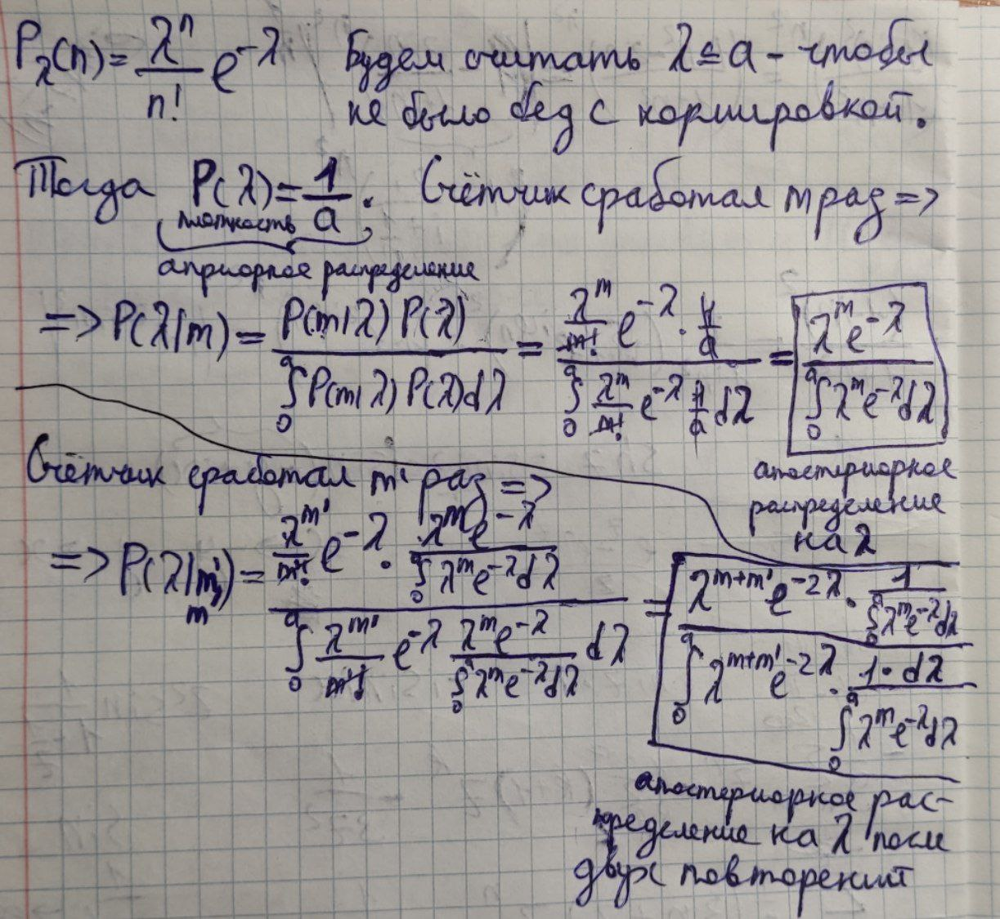

## **Задание 2 - Апостериорное распределение для аргумента нормального распределения.**

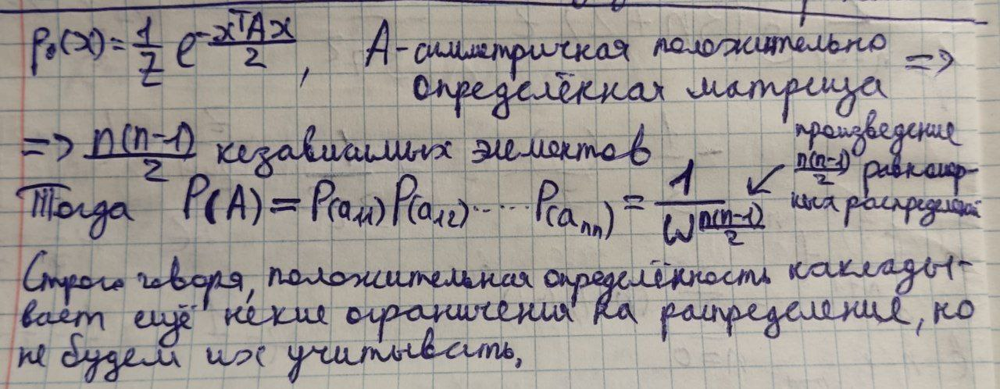

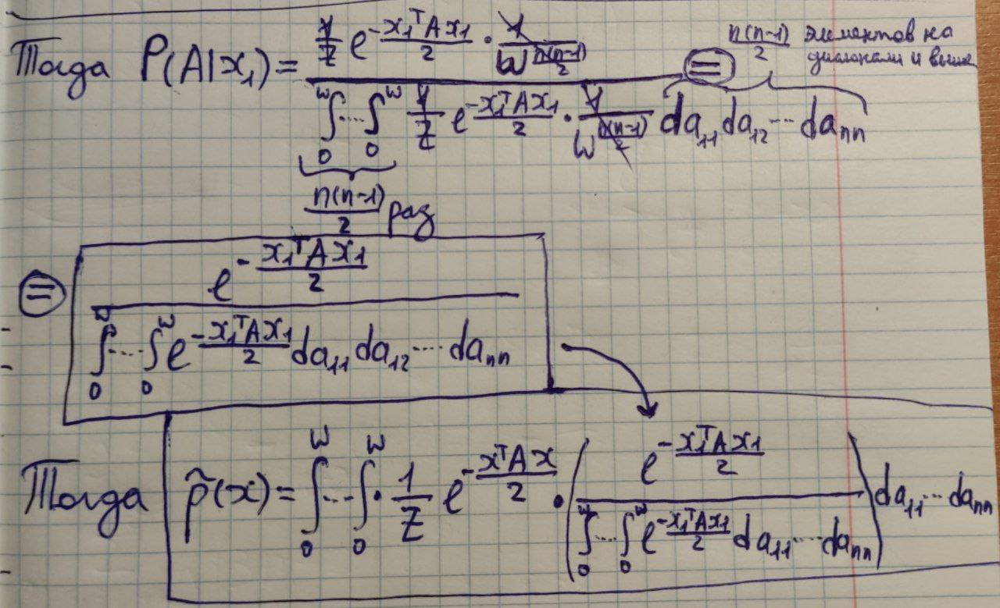

## **Задание 3 - $L_1$-регуляризация.**

In [26]:
import numpy as np
from sklearn.datasets import load_diabetes
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

In [27]:
def calculate_coef(model, X, y, log_min, log_max, 
               num):
    """
    Данная функция считает коэффициенты для признаков 
    при различных значениях параметра регуляризации.

    :param model: регрессионная модель
    :param X: матрица регрессоров
    :param y: вектор целевой переменной
    :param log_min, log_max: логарифмы левой и правой границ диапазона для коэффициента регуляризации
    :param num: число точек из диапазона

    :return coefs: коэффициенты модели
    """
    
    alphas = np.logspace(log_min, log_max, num) # сетка параметров   
    coefs = [] # коэффициенты моделей
    for a in alphas:
        if 'l1_ratio' in model.get_params(): # для ElasticNet
            a *= 3/2
            model.set_params(alpha=a) # переопределяем параметры модели
        else:
            model.set_params(alpha=a)
        model.fit(X, y)
        coefs.append(model.coef_) 
    return coefs

def draw_track(coefs, log_min, log_max, 
               num, title='', figsize=(10, 5)):
    
    """
    Данная функция строит график зависимости значений 
    коэффициентов модели от параметра регуляризации.
    
    :param coefs: коэффициенты модели
    :param log_min, log_max: логарифмы левой и правой границ диапазона для коэффициента регуляризации
    :param num: число точек из диапазона
    :param title: название графика
    :param figsize: размеры рисунка

    :return coefs: коэффициенты модели
    """
    alphas = np.logspace(log_min, log_max, num) # сетка параметров  

    plt.figure(figsize=figsize)
    ax = plt.gca() # используется для получения текущего экземпляра axes
    ax.hlines(0, 10 ** log_min, 10 ** log_max, linewidth=15, alpha=0.15)
    ind = 1
    for coef in np.array(coefs).T:
        label = r'$\theta_{' + str(ind) + '}$'
        ax.plot(alphas, coef, linewidth=2, label=label) # рисуем коэффициенты в зависимости от alpha
        ind += 1
        
    ax.set_xscale('log') # логарифмическая шкала
    ax.set_xlim(ax.get_xlim()[::-1])  # обратить ось
    plt.xlabel('Параметр регуляризации', fontsize=19)
    plt.ylabel('Значения коэффициентов', fontsize=19)
    plt.title(title, fontsize=22)
    plt.legend(loc='upper left', fontsize=8)
    plt.axis('tight')
    plt.show()

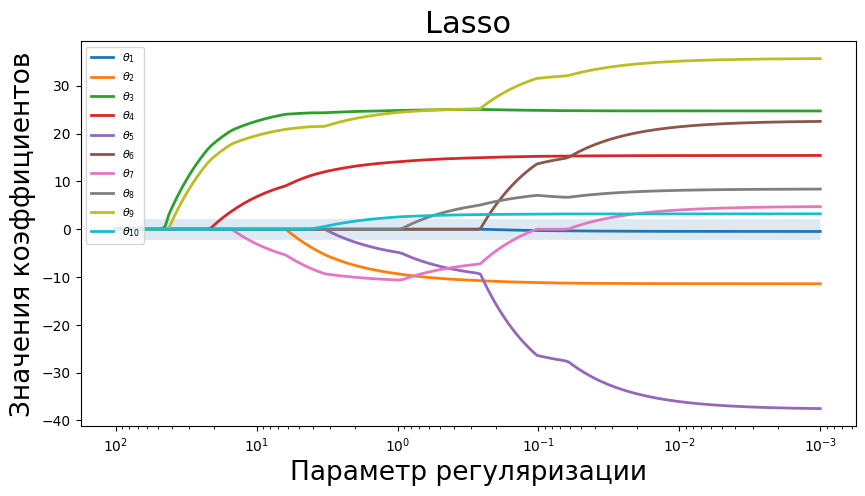

In [28]:
data, target = load_diabetes(return_X_y=True)

scaler = StandardScaler()
data = scaler.fit_transform(data)

lasso_model = Lasso()

lasso_coefs = calculate_coef(lasso_model, data, target, -3, 2,200)

draw_track(lasso_coefs,-3, 2,200, "Lasso")

## **Задание 4 - K-fold кроссвалидация и $L_1$-регуляризация градиентным спуском.**

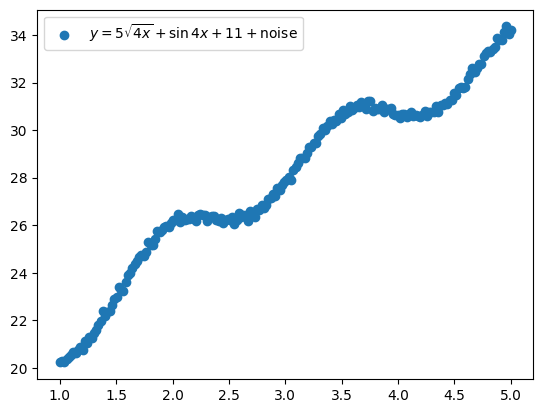

In [277]:
x = np.linspace(1,5,200)
y = 5*np.sqrt(4*x)+np.sin(4*x) + 11 + np.random.normal(0., 0.1, size = x.shape[0])

plt.scatter(x,y, label=r'$y = 5\sqrt{4x} + \sin{4x}+11 +$noise')
plt.legend()
plt.show()

In [253]:
def make_sin_matrix(x, max_order):
    X = np.ones((x.shape[0],1))
    for k in range(1, max_order + 1):
        X = np.concatenate([X, (np.sin(k*x)).reshape(-1,1)], axis = 1)
    return X

In [254]:
def make_L1_regression_grad_descent_iteration(X, y, w, mu, alpha):
    grad = 2 * X.T @ (X @ w - y) + mu * np.sign(w)
    w -= alpha * grad
    return w, grad

In [255]:
def fit_w_GD(X,y,epsilon, mu, alpha):
    w = np.random.randint(-5,5, size=(X.shape[1],1)).astype("float64")
    
    w, grad_f = make_L1_regression_grad_descent_iteration(X,y,w, mu, alpha)
    n_grad = np.linalg.norm(grad_f, ord=2)
    evolution = w
    n = 0
    while n_grad > epsilon:
        w, grad_f = make_L1_regression_grad_descent_iteration(X,y,w, mu, alpha)
        n_grad = np.linalg.norm(grad_f, ord=2)
        evolution = np.vstack((evolution, w))
        n+=1
        if n>10000: 
            break
    
    return w

In [267]:
from sklearn.model_selection import KFold
 
kf = KFold(n_splits=3)

lr_grid = np.linspace(0.00002,0.00006, 10)
mu_grid = np.linspace(12,20,20)

epsilon = pow(10,-6)

X = make_sin_matrix(x, 6)

optim_params = (0,0)
w_optim = 0
min_loss = np.inf

for lr in lr_grid:
    for mu in mu_grid:
        print(lr, mu)
        mean_w = 0
        for train_ids, test_ids in kf.split(X):
            w = fit_w_GD(X[train_ids], y[train_ids].reshape(-1,1), epsilon, mu,lr)       
            mean_w += w/3
        loss = np.linalg.norm(X @ mean_w - y, 2)
        if loss < min_loss:
            optim_params = (lr, mu)
            min_loss = loss
            w_optim = mean_w

print(optim_params)


(2.4444444444444445e-05, 19.157894736842103)


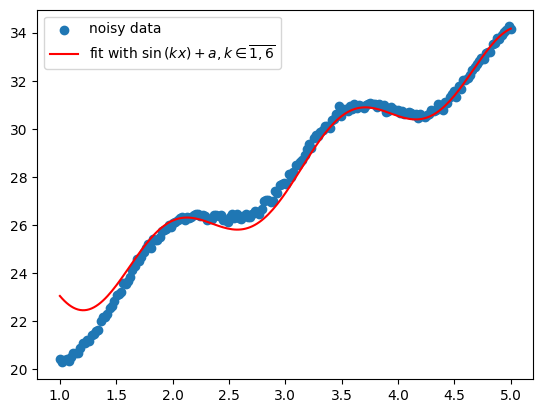

In [275]:
plt.scatter(x,y, label="noisy data")
plt.plot(x, X @ w_optim, "r", label=r"fit with $\sin{(kx)} + a, k\in \overline{1,6}$")
plt.legend()
plt.show()


*Примечание:* "хвост" в начале графика образовался из-за того, что фиттинг производился исключительно функциями вида $\sin{kx}$ (причём очень небольшим их количеством - ради ускорения вычислений), а также сдвигом $a$ вдоль оси $Oy$, в то время как исходная функция содержала $\sqrt{x}$.

Градиентный спуск работал стабильно относительно стартовых данных $w$, так как при каждом запуске генерируется случайный вектор весов $w_0$, однако при этом результат (оптимальные параметры learning rate, коэффициент регуляризации и $w_{\text{оптим}}$) оставался неизменным.

## **Задание 5 - Лассо Тибширани: связь $L_1$ и $L_2$ между собой.**

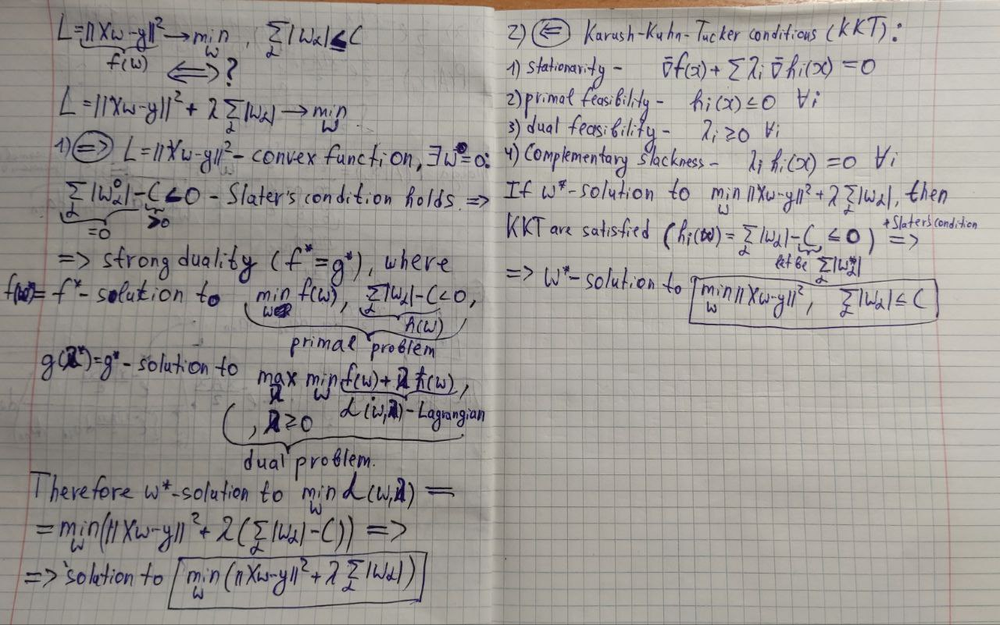

## **Задание 6 - Bias-Variance decomposition**

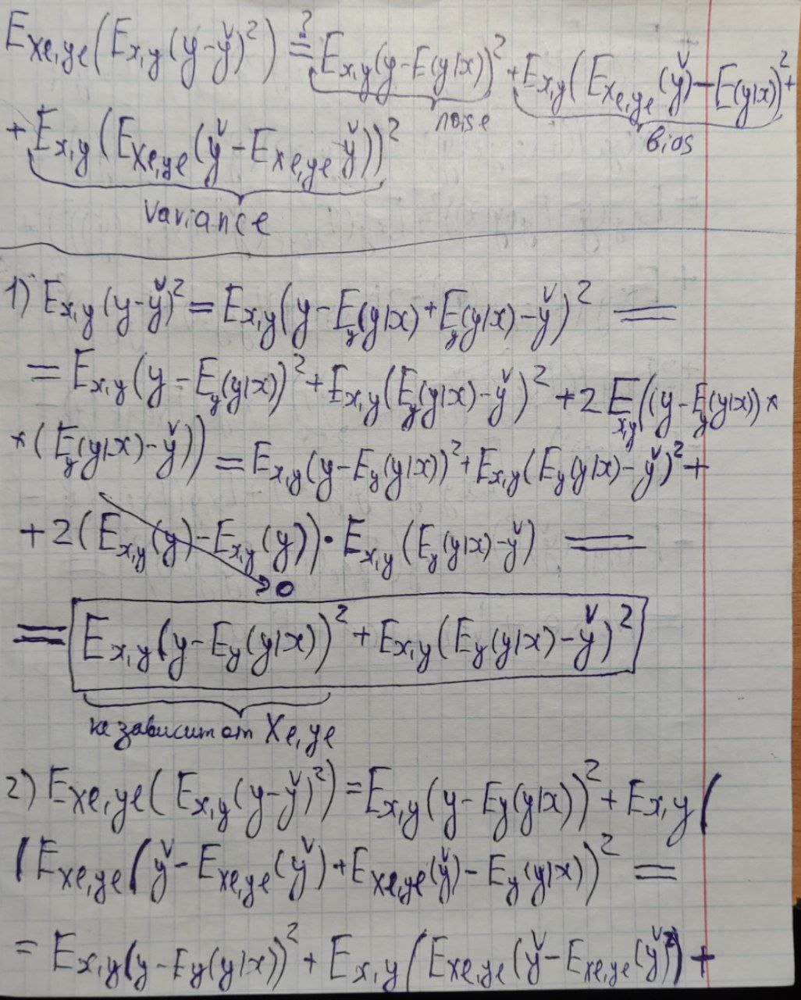

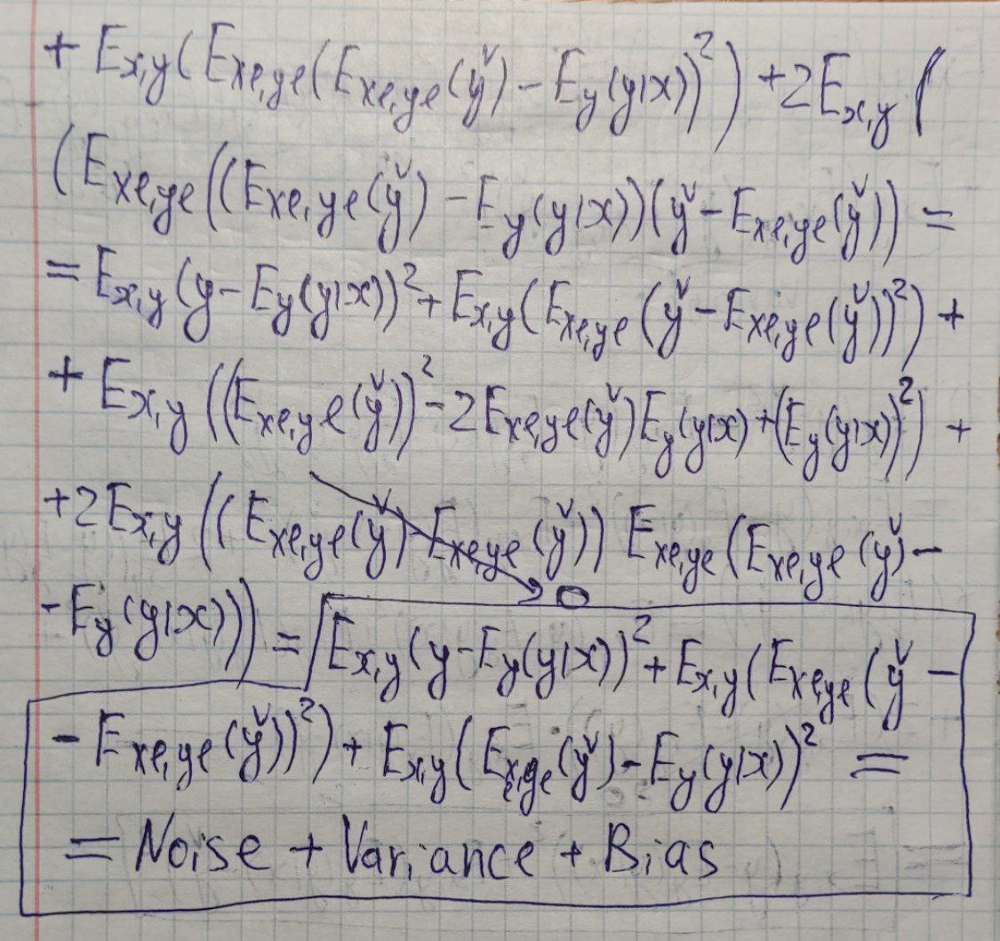